In [1]:
import os
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import sys
from matplotlib import animation, rc
from IPython.display import HTML, Image
import seaborn
seaborn.set_theme(style="whitegrid", palette='pastel')

src_dir = os.path.abspath("/home/mmfarrugia/repos/optimization/hybrid_optimizer")
sys.path.append(src_dir)

from hybrid_optimizer import PSO_GA
from plotters import plot_cost_history, plot_contour, plot_surface, plot_summary, Mesher, Designer
import example_funcs

Himmelblau's  objective function

    Only takes two dimensions and has a four equal global minimums
     of zero at :code:`f([3.0,2.0])`, :code:`f([-2.805118,3.131312])`,
     :code:`f([-3.779310,-3.283186])`, and :code:`f([3.584428,-1.848126])`.
    Its coordinates are bounded within :code:`[-5,5]`.

    Best visualized with the full domain and a range of :code:`[0,1000]`

In [2]:
n_dim = 2
lb = [-5.0, -5.0]
ub = [5.0, 5.0]
size_pop = 100
common_start = np.random.uniform(low=lb, high=ub, size=(size_pop, n_dim))

random_config = {
    "n_dim": 2,
    "lb": lb,
    "ub": ub,
    "size_pop": size_pop,
    "vectorize_func": False,
    "taper_GA": True,
    "taper_mutation": True,
    "max_iter": 500,
    "initial_guesses":common_start,
    "guess_deviation":0,
    "guess_ratio":1.0,
    "mutation_strategy": 'DE/rand/1'
}
best_config = {
    "n_dim": 2,
    "lb": lb,
    "ub": ub,
    "size_pop": size_pop,
    "vectorize_func": False,
    "taper_GA": True,
    "taper_mutation": True,
    "max_iter": 500,
    "initial_guesses":common_start,
    "guess_deviation":0,
    "guess_ratio":1.0,
    "mutation_strategy": 'DE/best/1'
}

In [51]:
from plotters import plot_cost_history, plot_contour, plot_surface, Mesher, Designer
#Plot the sphere function's mesh for better plots
m = Mesher(func=example_funcs.himmelblau, limits=[(-5,5), (-5,5)], levels = [1e-5, 1e-4, 0.001, 0.01, 0.1, 1., 10, 100, 1000])
#Adjust figure limits
d = Designer(limits=[(-5,5), (-5,5), (0,1000)], label=['x-axis', 'y-axis', 'z-axis'])

'Rand' Mutation
/DE/rand/1

best_x is  [-2.80511978  3.13131101] best_y is [1.88174389e-10]


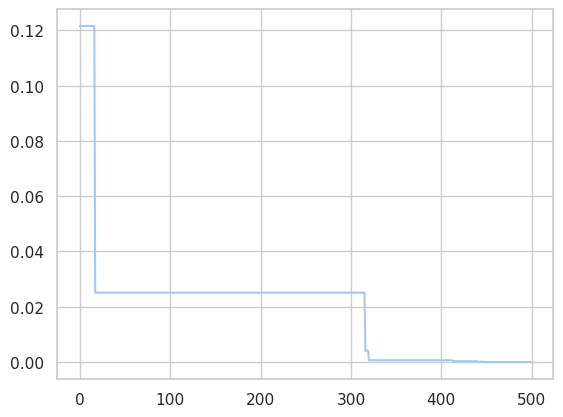

In [40]:
ho_rand_1 = PSO_GA(example_funcs.himmelblau,  n_dim=2, config=random_config)
ho_rand_1.record_mode = True
ho_rand_1.run()
print('best_x is ', ho_rand_1.gbest_x, 'best_y is', ho_rand_1.gbest_y)
plt.plot(ho_rand_1.gbest_y_hist)
plt.show()

'Best' Mutation
/DE/best/1

best_x is  [2.99887711 1.99984488] best_y is [5.05275561e-05]


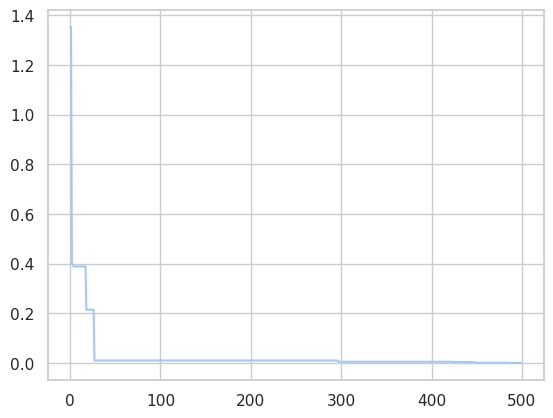

In [41]:
ho_best_1 = PSO_GA(example_funcs.himmelblau, n_dim=2, config=best_config)
ho_best_1.record_mode = True
ho_best_1.run()
print('best_x is ', ho_best_1.gbest_x, 'best_y is', ho_best_1.gbest_y)
plt.plot(ho_best_1.gbest_y_hist)
plt.show()

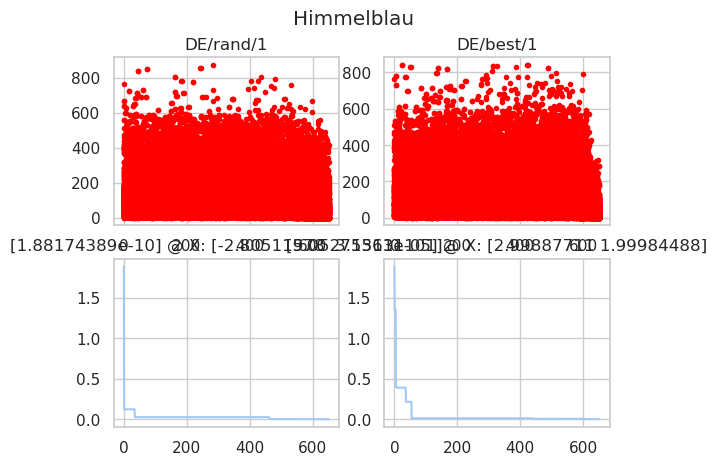

In [42]:
import pandas as pd

Y_history_rand = pd.DataFrame(np.array(ho_rand_1.record_value['Y']).reshape((-1, ho_rand_1.size_pop)))
Y_history_best = pd.DataFrame(np.array(ho_best_1.record_value['Y']).reshape((-1, ho_best_1.size_pop)))
fig, ax = plt.subplots(2, 2)
fig.suptitle('Himmelblau')
ax[0,0].set_title('DE/rand/1')
ax[0,1].set_title('DE/best/1')
ax[1,0].set_title(str(ho_rand_1.gbest_y)+' @ X: '+str(ho_rand_1.gbest_x))
ax[1,1].set_title(str(ho_best_1.gbest_y)+' @ X: '+str(ho_best_1.gbest_x))
ax[0,0].plot(Y_history_rand.index, Y_history_rand.values, '.', color='red')
ax[0,1].plot(Y_history_best.index, Y_history_best.values, '.', color='red')
Y_history_rand.min(axis=1).cummin().plot(kind='line', ax=ax[1,0])
Y_history_best.min(axis=1).cummin().plot(kind='line', ax=ax[1,1])
plt.show()

In [43]:
%%capture plsGod

Y_history_rand = pd.DataFrame(np.array(ho_rand_1.record_value['Y']).reshape((-1, ho_rand_1.size_pop)))
Y_history_best = pd.DataFrame(np.array(ho_best_1.record_value['Y']).reshape((-1, ho_best_1.size_pop)))
fig, ax = plt.subplots(3, 2)
fig.suptitle('Himmelblau')
ax[0,0].set_title('DE/rand/1')
ax[0,1].set_title('DE/best/1')
ax[1,0].set_title(str(ho_rand_1.gbest_y)+' @ X: '+str(ho_rand_1.gbest_x), fontsize=8)
ax[1,1].set_title(str(ho_best_1.gbest_y)+' @ X: '+str(ho_best_1.gbest_x))
ax[0,0].plot(Y_history_rand.index, Y_history_rand.values, '.', color='red')
ax[0,1].plot(Y_history_best.index, Y_history_best.values, '.', color='red')
Y_history_rand.min(axis=1).cummin().plot(kind='line', ax=ax[1,0])
Y_history_best.min(axis=1).cummin().plot(kind='line', ax=ax[1,1])
plot_contour(pos_history=ho_rand_1.record_value['X'], mesher=m, designer=d, canvas=(fig, ax[2,0]))
#plot_contour(pos_history=ho_best_1.record_value['X'], mesher=m, designer=d, ax=ax[2,1])
plt.show()


KeyboardInterrupt: 

In [52]:
%%capture

#Make animation
animation2D_rand = plot_contour(pos_history=ho_rand_1.record_value['X'], mesher=m, designer=d)


In [53]:
animation2D_rand.save('himmelblau_rand.gif', writer='ffmpeg', fps=15)

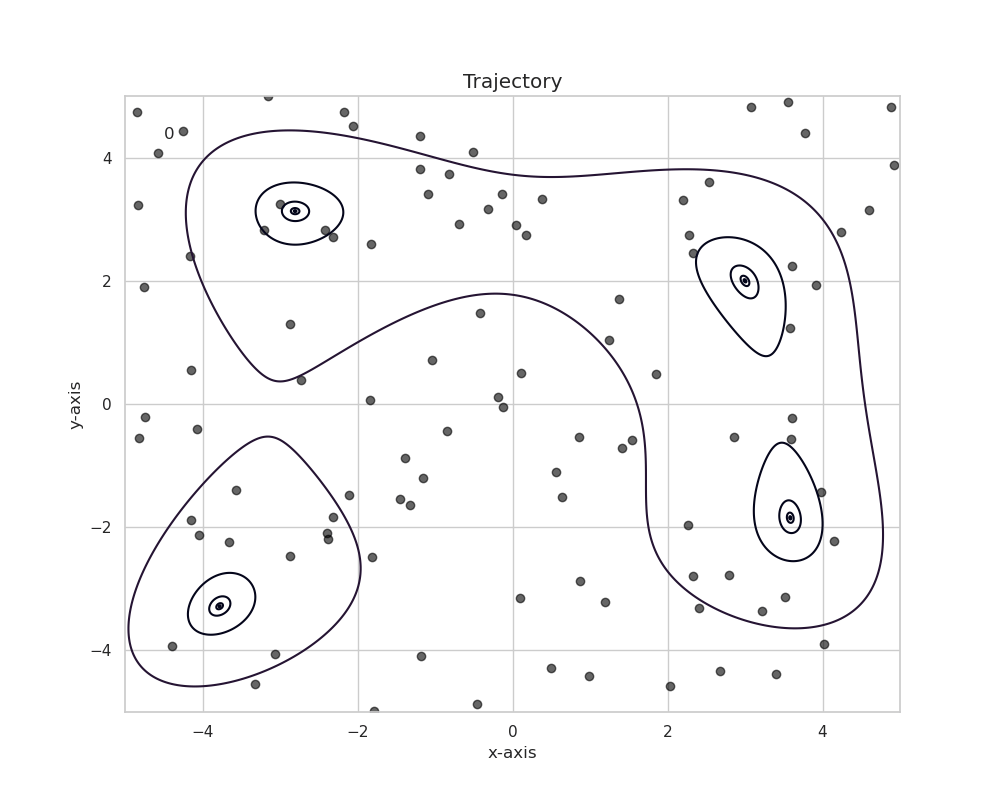

In [54]:
Image('himmelblau_rand.gif')

In [55]:
%%capture

#Make animation
animation2D_best = plot_contour(pos_history=ho_best_1.record_value['X'], mesher=m, designer=d)


In [56]:
animation2D_best.save('himmelblau_best.gif', writer='ffmpeg', fps=15)

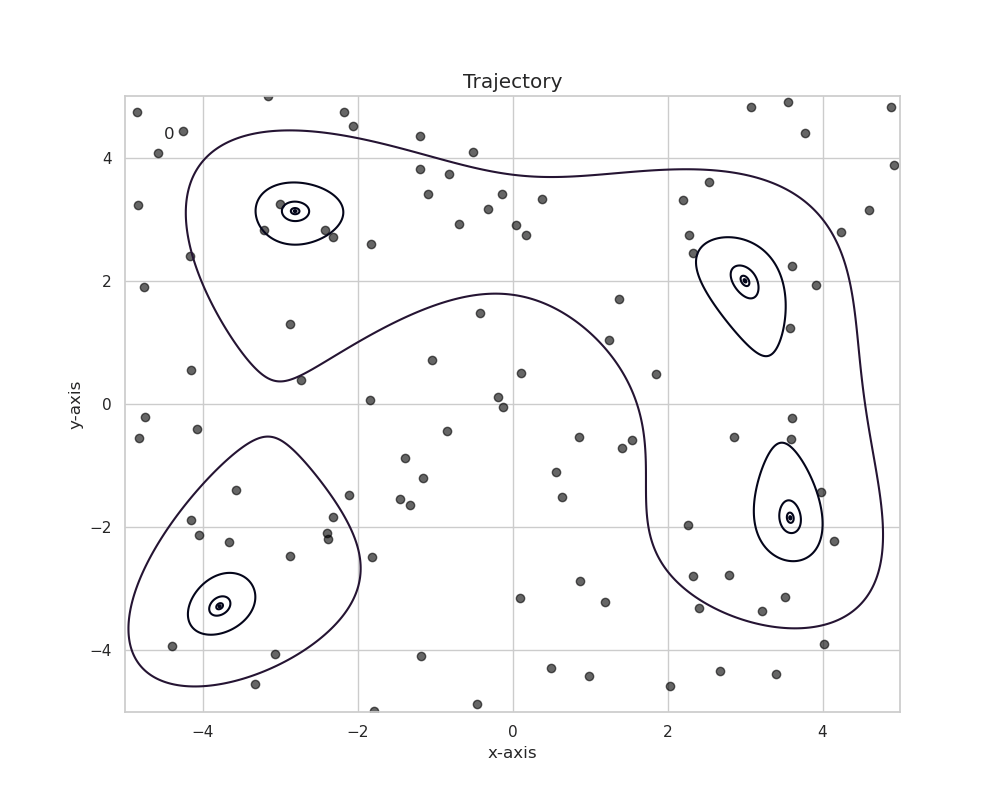

In [57]:
Image('himmelblau_best.gif')

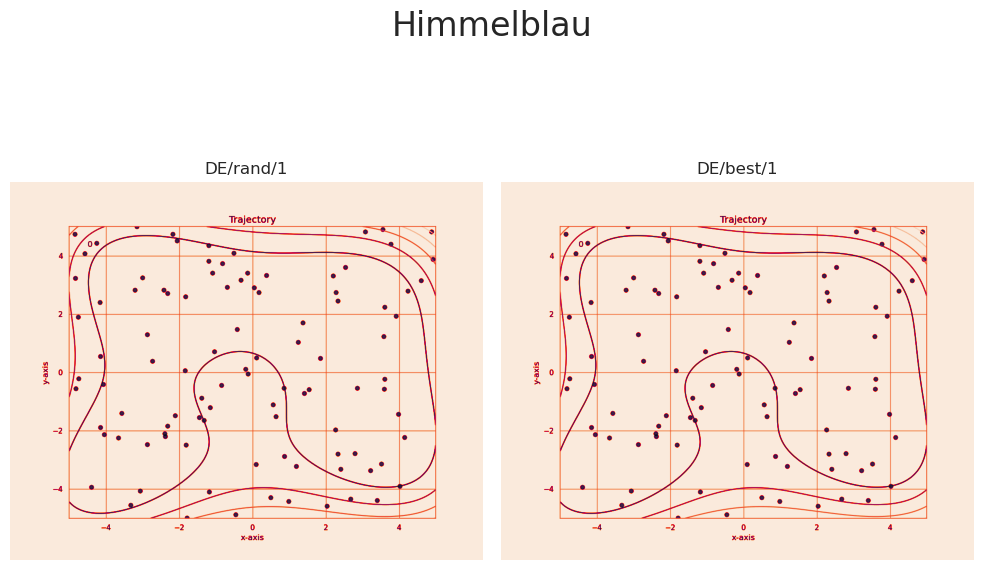

In [19]:
from PIL import Image as img
fig, ax = plt.subplots(1, 2, figsize=(10,7))
fig.suptitle('Himmelblau', fontsize=24)
ax[0].set_title('DE/rand/1')
ax[1].set_title('DE/best/1')
  
# showing image 
ax[0].imshow(np.asarray(img.open('himmelblau_rand.gif'))) 
ax[0].axis('off') 

ax[1].imshow(np.asarray(img.open('himmelblau_best.gif'))) 
ax[1].axis('off')

fig.tight_layout()
# fig.add_subplot(rows, columns, 2) 
# plt.imshow(Image('himmelblau_best.gif')) 
# plt.axis('off') 
# plt.title("DE/best/1")

In [58]:
pos_history_3d_rand = m.compute_history_3d(ho_rand_1.record_value['X']) #preprocessing

In [59]:
%%capture

animation3d_rand = plot_surface(pos_history=pos_history_3d_rand, mesher=m, designer=d)
plt.show()


In [60]:
animation3d_rand.save('himmelblau_3d_rand.gif', writer='ffmpeg', fps=15)
Image(url='himmelblau_3d_rand.gif')

In [61]:
pos_history_3d_best = m.compute_history_3d(ho_best_1.record_value['X']) #preprocessing

In [62]:
%%capture

animation3d_best = plot_surface(pos_history=pos_history_3d_best, mesher=m, designer=d)
plt.show()


In [63]:
animation3d_best.save('himmelblau_3d_best.gif', writer='ffmpeg', fps=15)
Image(url='himmelblau_3d_best.gif')

In [ ]:
opts = [ho_rand_1, ho_best_1]

In [ ]:
%%capture

ani_summary = plot_summary(optimizers=opts, title="Himmelblau", titles=[opt.mutation_strategy for opt in opts],  n_processes=8, mesher=m, designer=d)
plt.show()

In [ ]:
ani_summary.save('himmelblau_fig.gif', writer='ffmpeg', fps=15)
Image(url='himmelblau_fig.gif')